<a href="https://colab.research.google.com/github/AllanKamimura/AI/blob/master/satelite%20mask/gif_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#prepare data
import os
import random

#important libraries
import numpy as np
import tensorflow as tf
import matplotlib as mpl
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#upload test images
from google.colab import files
from google_drive_downloader import GoogleDriveDownloader

#save images and make gif
import imageio

In [94]:
# tmp download save data
id = "1pmYkqACkcDi45YaGeWrxkItwKS7Vobdb"
folder = "save"

GoogleDriveDownloader.download_file_from_google_drive(file_id = id,
                                                      dest_path = os.path.join("/content/", folder + ".zip"),
                                                      unzip = True)

Unzipping...Done.


In [2]:
# download test data
id = "1pm7BB0JnqDUJU8qSny6mUvku15725Xv4"
folder = "test_data"

GoogleDriveDownloader.download_file_from_google_drive(file_id = id,
                                                      dest_path = os.path.join("/content/", folder + ".zip"),
                                                      unzip = True)


Unzipping...Done.


In [95]:
# load save data
cloud_sequential_model = tf.keras.models.load_model("/content/save/cloud_NN1.h5")
cloud_unet_model = tf.keras.models.load_model("/content/save/cloud_test_NN2.h5")
dust_sequential_model = tf.keras.models.load_model("/content/save/dust_NN1.h5")
dust_unet_model = tf.keras.models.load_model("/content/save/dust_NN2.h5")
water_sequential_model = tf.keras.models.load_model("/content/save/water_NN1.h5")
water_unet_model = tf.keras.models.load_model("/content/save/water_test_NN2.h5")

sequential_models = [cloud_sequential_model, dust_sequential_model, water_sequential_model]
unet_models = [cloud_unet_model, dust_unet_model, water_unet_model]

In [126]:
def full_predict(models, input_arr, uncertain_threshold, dust_power):

    cloud = models[0].predict(input_arr)
    dust = models[1].predict(input_arr) * dust_power
    water = models[2].predict(input_arr)
    uncertain = tf.ones_like(cloud) * uncertain_threshold
    full_image = tf.concat([cloud, dust, water, uncertain], axis = -1)
    full_image = tf.squeeze(full_image)
    print(full_image.shape)
    return full_image

In [97]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    # pred_mask = pred_mask[..., tf.newaxis]
    print(pred_mask.shape)
    return pred_mask

In [102]:
def predict_mask(models, uncertain_threshold, image_path, image_list, alpha = 1, beta = 1):
    try:
        os.mkdir("/content/predicts")
    except:
        pass
    for image in image_list:
        input = tf.keras.preprocessing.image.load_img(os.path.join(image_path, image), target_size = (256, 256))
        input_arr = tf.keras.preprocessing.image.img_to_array(input)
        input_arr = input_arr / 255.0
        reshape_input = np.reshape(input_arr, (1,256,256,3))

        sequential_image = full_predict(models = models[0], input_arr = reshape_input, uncertain_threshold = uncertain_threshold, dust_power = 1.0)
        sequential_mask = create_mask(pred_mask = sequential_image)

        unet_image = full_predict(models = models[1], input_arr = reshape_input, uncertain_threshold = uncertain_threshold, dust_power = 2.0)
        unet_mask = create_mask(pred_mask = unet_image)
        

        result_image = (alpha * sequential_image + beta * unet_image) / (alpha + beta)
        result_mask = create_mask(pred_mask = result_image)

        fig = plt.figure(figsize = (20, 20))
        fig.subplots_adjust(hspace = -1.5)

        fig.add_subplot(1, 2, 1)
        plt.setp(plt.title("INPUT", fontdict = {"fontsize" : "xx-large", 'fontweight' : "bold"}), color = "green", fontfamily = "sans-serif")         
        plt.imshow(input_arr)

        fig.add_subplot(1, 2, 2)
        unet_mask = np.reshape(unet_mask, (256,256))  
        plt.setp(plt.title("OUTPUT:", fontdict = {"fontsize" : "xx-large", 'fontweight' : "bold"}), color = "green", fontfamily = "sans-serif")
        plt.imshow(result_mask, cmap = mpl.colors.ListedColormap([[1.0,1.0,1.0,1], [1.0,0.5,0.1,1], [0.1,0.1,1.0,1]]))

        fig.add_subplot(2, 2, 1)
        unet_mask = np.reshape(unet_mask, (256,256))  
        plt.setp(plt.title("OUTPUT: UNET", fontdict = {"fontsize" : "xx-large", 'fontweight' : "bold"}), color = "green", fontfamily = "sans-serif")
        plt.imshow(unet_mask, cmap = mpl.colors.ListedColormap([[1.0,1.0,1.0,1], [1.0,0.5,0.1,1], [0.1,0.1,1.0,1]]))

        fig.add_subplot(2, 2, 2)
        sequential_mask = np.reshape(sequential_mask, (256,256))  
        plt.setp(plt.title("OUTPUT: SEQUENTIAL", fontdict = {"fontsize" : "xx-large", 'fontweight' : "bold"}), color = "green", fontfamily = "sans-serif")
        plt.imshow(sequential_mask, cmap = mpl.colors.ListedColormap([[1.0,1.0,1.0,1], [1.0,0.5,0.1,1], [0.1,0.1,1.0,1]]))

        labels = ["Cloud", "Dust", "Water", "uncertain"]
        cmap = {0: [1.0,1.0,1.0,1], 1 : [1.0,0.5,0.1,1], 2 : [0.1,0.1,1.0,1], 3: [0.0,0.0,0.0,1]}
        patches = [mpl.patches.Patch( color = cmap[i], label = labels[i] ) for i in cmap]
        legend = plt.legend(handles = patches, bbox_to_anchor = (1.4, 1.15), fontsize = "xx-large")
        frame = legend.get_frame()
        frame.set_facecolor('green')

        fig.savefig("/content/predicts/{}.png".format(image), bbox_inches = "tight")
        plt.show()

In [132]:
def predict_mask(models, uncertain_threshold, image_path, image_list, alpha = 1, beta = 1):
    try:
        os.mkdir("/content/predicts")
    except:
        pass
    date_list = []
    dust_list = []
    for image in image_list:
        input = tf.keras.preprocessing.image.load_img(os.path.join(image_path, image), target_size = (256, 256))
        input_arr = tf.keras.preprocessing.image.img_to_array(input)
        input_arr = input_arr / 255.0
        reshape_input = np.reshape(input_arr, (1,256,256,3))

        sequential_image = full_predict(models = models[0], input_arr = reshape_input, uncertain_threshold = uncertain_threshold, dust_power = 1.0)

        unet_image = full_predict(models = models[1], input_arr = reshape_input, uncertain_threshold = uncertain_threshold, dust_power = 2.0)

        result_image = (alpha * sequential_image + beta * unet_image) / (alpha + beta)
        result_mask = create_mask(pred_mask = result_image)

        date, _ = image.split(".")
        date_list.append(date)

        count_cloud = np.count_nonzero(result_mask == 0)
        count_dust = np.count_nonzero(result_mask == 1)
        count_water = np.count_nonzero(result_mask == 2)
        count_uncertain = np.count_nonzero(result_mask == 3)

        cloud_percent = count_cloud * 100 / (count_cloud + count_dust + count_water + count_uncertain)
        dust_percent = count_dust * 100 / (count_cloud + count_dust + count_water + count_uncertain)
        water_percent = count_water * 100 / (count_cloud + count_dust + count_water + count_uncertain)
        uncertain_percent = count_uncertain * 100 / (count_cloud + count_dust + count_water + count_uncertain)

        dust_list.append(dust_percent)

        fig = plt.figure(figsize = (20,20))
        gs = fig.add_gridspec(2, 2)
        f_ax1 = fig.add_subplot(gs[0, 0])
        plt.imshow(input_arr)
        plt.setp(plt.title("INPUT", fontdict = {"fontsize" : "xx-large", 'fontweight' : "bold"}), color = "green", fontfamily = "sans-serif")         

        f_ax2= fig.add_subplot(gs[0, 1])
        plt.imshow(result_mask, cmap = mpl.colors.ListedColormap([[1.0,1.0,1.0,1], [1.0,0.5,0.1,1], [0.1,0.1,1.0,1], [0.0,0.0,0.0,1]]))
        plt.setp(plt.title("OUTPUT", fontdict = {"fontsize" : "xx-large", 'fontweight' : "bold"}), color = "green", fontfamily = "sans-serif")       

        labels = ["Cloud \n{:.2f}%".format(cloud_percent), "Dust \n{:.2f}%".format(dust_percent), "Ocean \n{:.2f}%".format(water_percent), "Uncertain \n{:.2f}%".format(uncertain_percent)]
        cmap = {0: [1.0,1.0,1.0,1], 1 : [1.0,0.5,0.1,1], 2 : [0.1,0.1,1.0,1], 3: [0.0,0.0,0.0,1]}
        patches = [mpl.patches.Patch( color = cmap[i], label = labels[i] ) for i in cmap]
        legend = plt.legend(handles = patches, bbox_to_anchor = (1.5, 0.7), fontsize = "xx-large")
        frame = legend.get_frame()
        frame.set_facecolor([0.0,1.0,0.0,1])

        f_ax3 = fig.add_subplot(gs[1, :])
        x_values = [datetime.datetime.strptime(d,"%Y-%m-%d").date() for d in date_list]
        formatter = mpl.dates.DateFormatter("%d-%m")
        f_ax3.xaxis.set_major_formatter(formatter)
        locator = mpl.dates.DayLocator()
        f_ax3.xaxis.set_major_locator(locator)

        f_ax3.plot(x_values,dust_list, 'r--', linewidth = 4, zorder = 0)
        f_ax3.scatter(x_values,dust_list , s = 200,zorder = 10)
        plt.setp(plt.title("Daily dust graph", fontdict = {"fontsize" : "xx-large", 'fontweight' : "bold"}), color = "green", fontfamily = "sans-serif")       
        plt.xlabel("Date", fontdict = {"fontsize" : "xx-large", 'fontweight' : "bold"}, color = "green")
        plt.ylabel("Dust percentage", fontdict = {"fontsize" : "xx-large", 'fontweight' : "bold"}, color = "green")

        try:
            diference = dust_list[-1] - dust_list[-2]
        except:
            diference = 0

        labels = ["Mean \n{:.2f}%".format(sum(dust_list) / len(dust_list)), "Last day change \n{:.2f}%".format(diference), "Dustier day \n{}".format(date_list[np.argmax(np.array(dust_list))])]
        cmap = {0: [0.0,1.0,0.0,0], 1 : [0.0,1.0,0.0,0], 2 : [0.0,1.0,0.0,0]}
        patches = [mpl.patches.Patch( color = cmap[i], label = labels[i] ) for i in cmap]
        legend = plt.legend(handles = patches, bbox_to_anchor = (1.22, 0.7), fontsize = "xx-large")

        fig.savefig("/content/predicts/{}.png".format(image), bbox_inches = "tight")
        plt.show()

In [ ]:
# uploaded = files.upload()
# image_list = uploaded.keys()
# predict_mask(models = [sequential_models, unet_models], 
#              uncertain_threshold = 0.1,
#              image_list = image_list)


(256, 256, 4)
(256, 256, 4)
(256, 256)


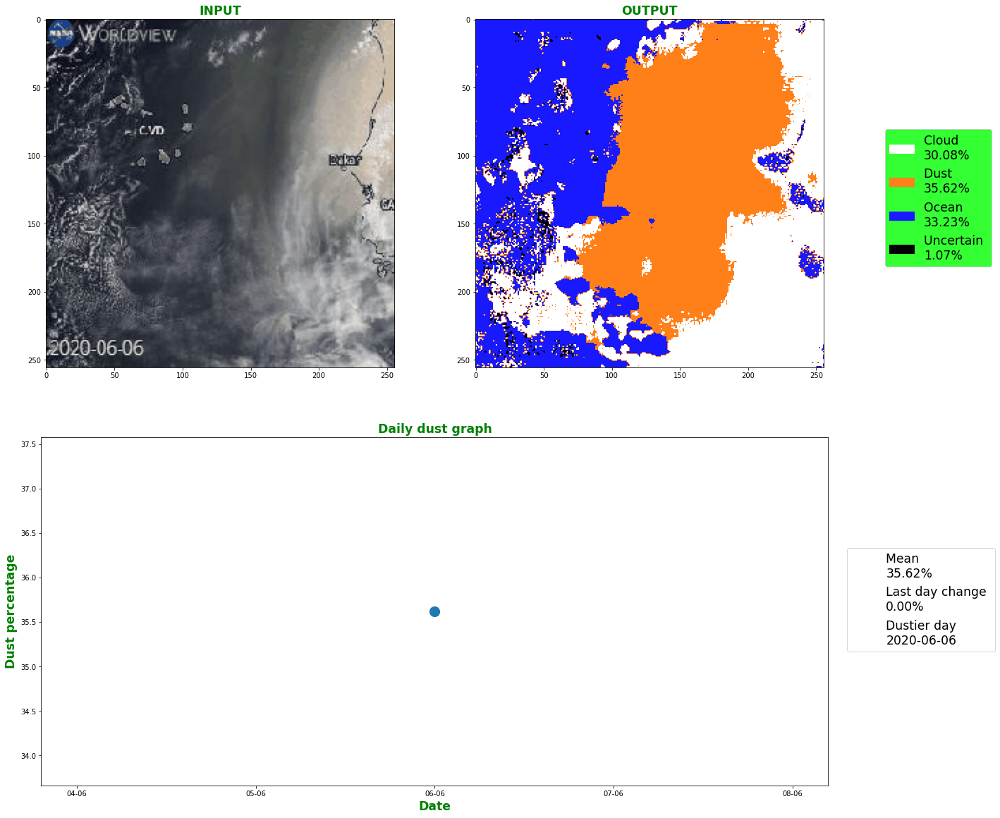

(256, 256, 4)
(256, 256, 4)
(256, 256)


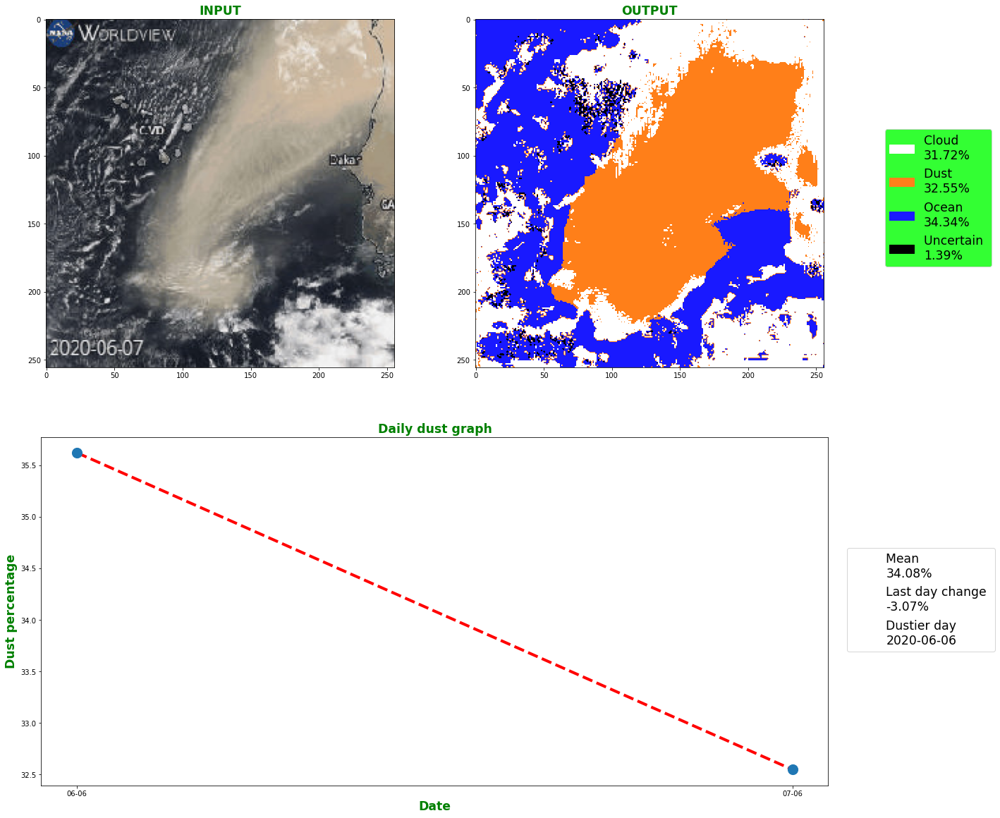

(256, 256, 4)
(256, 256, 4)
(256, 256)


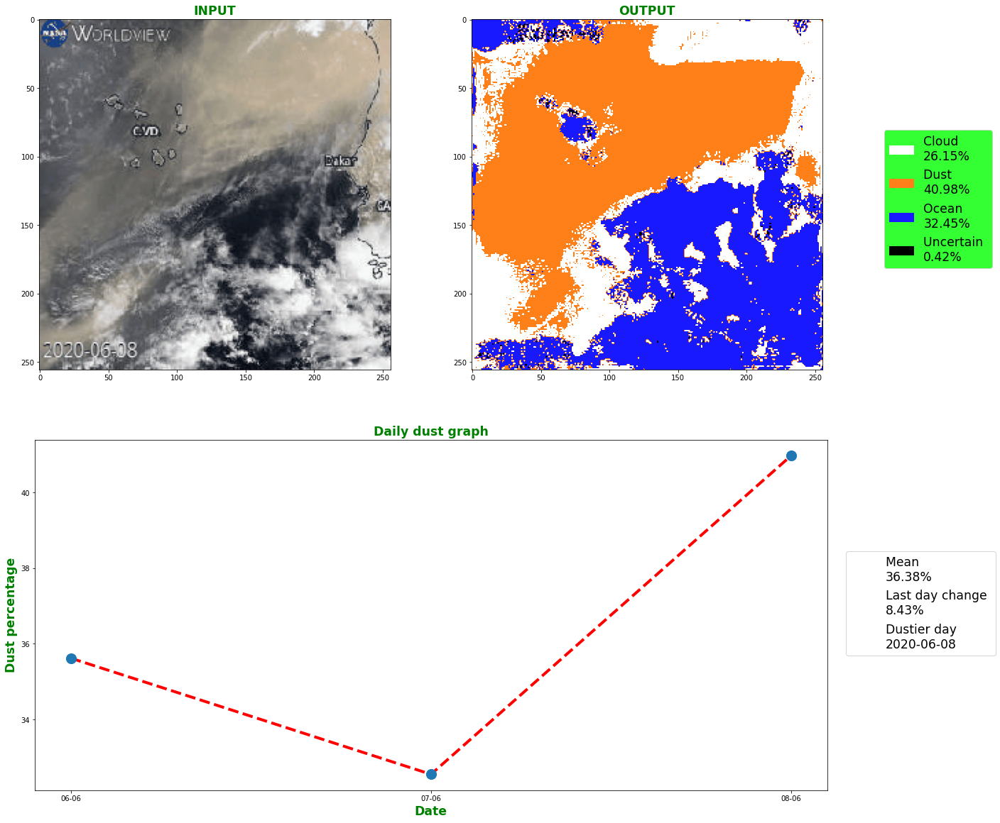

(256, 256, 4)
(256, 256, 4)
(256, 256)


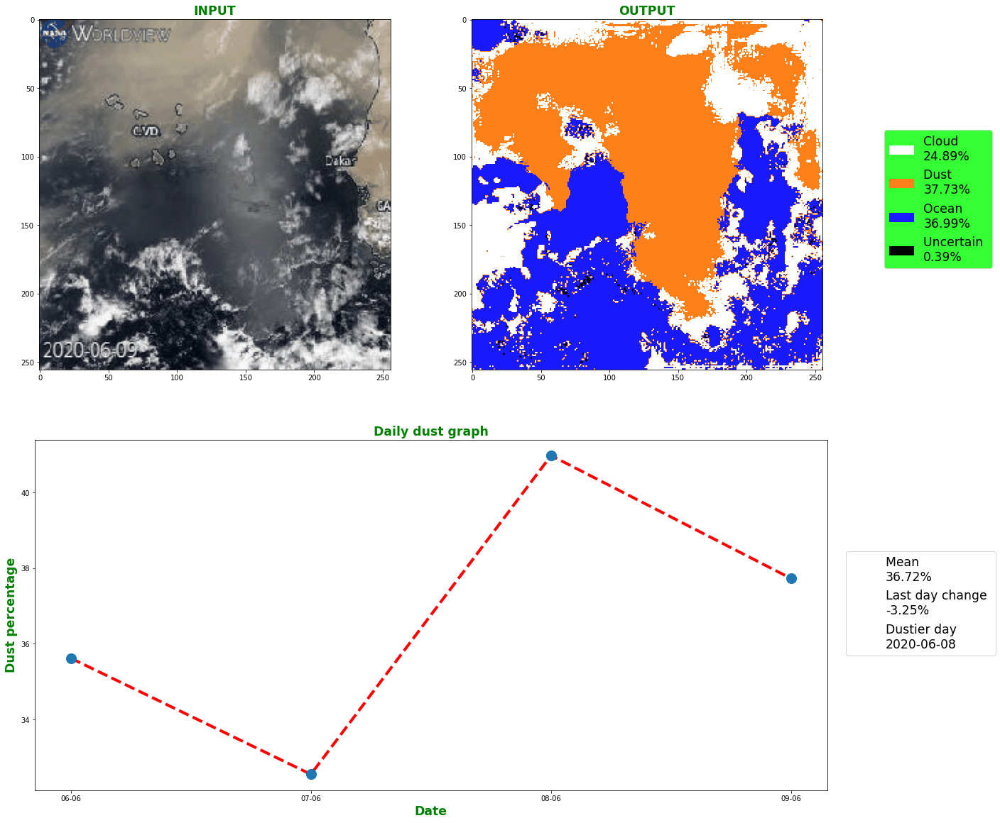

(256, 256, 4)
(256, 256, 4)
(256, 256)


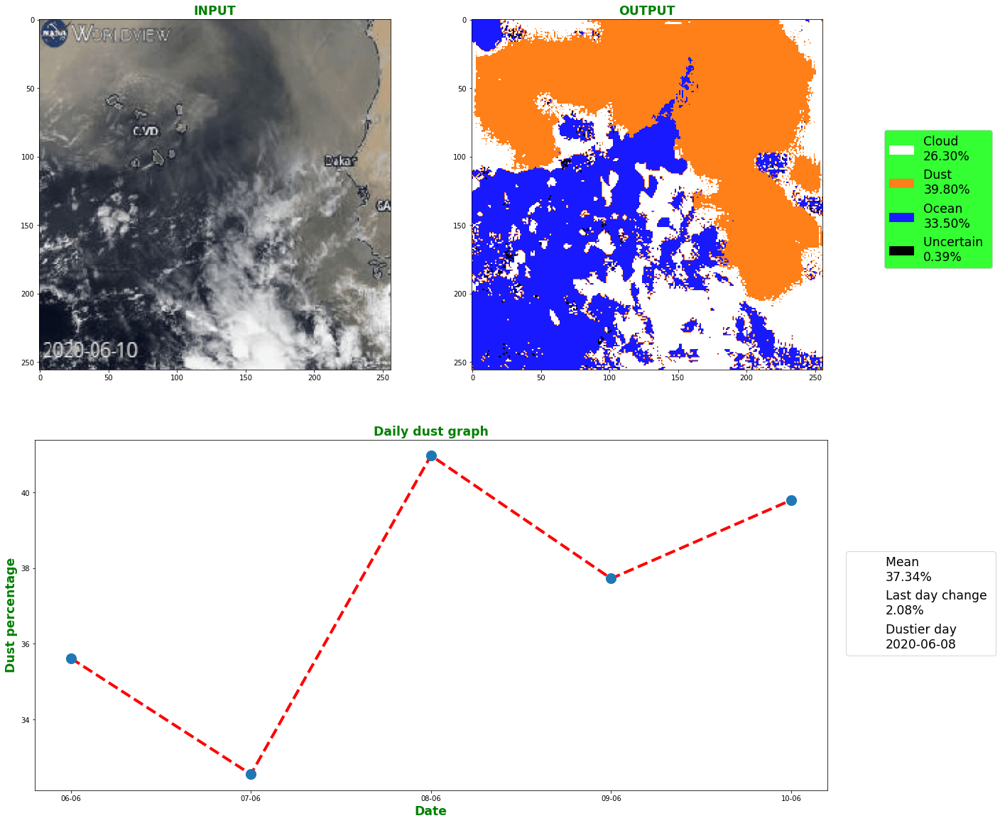

(256, 256, 4)
(256, 256, 4)
(256, 256)


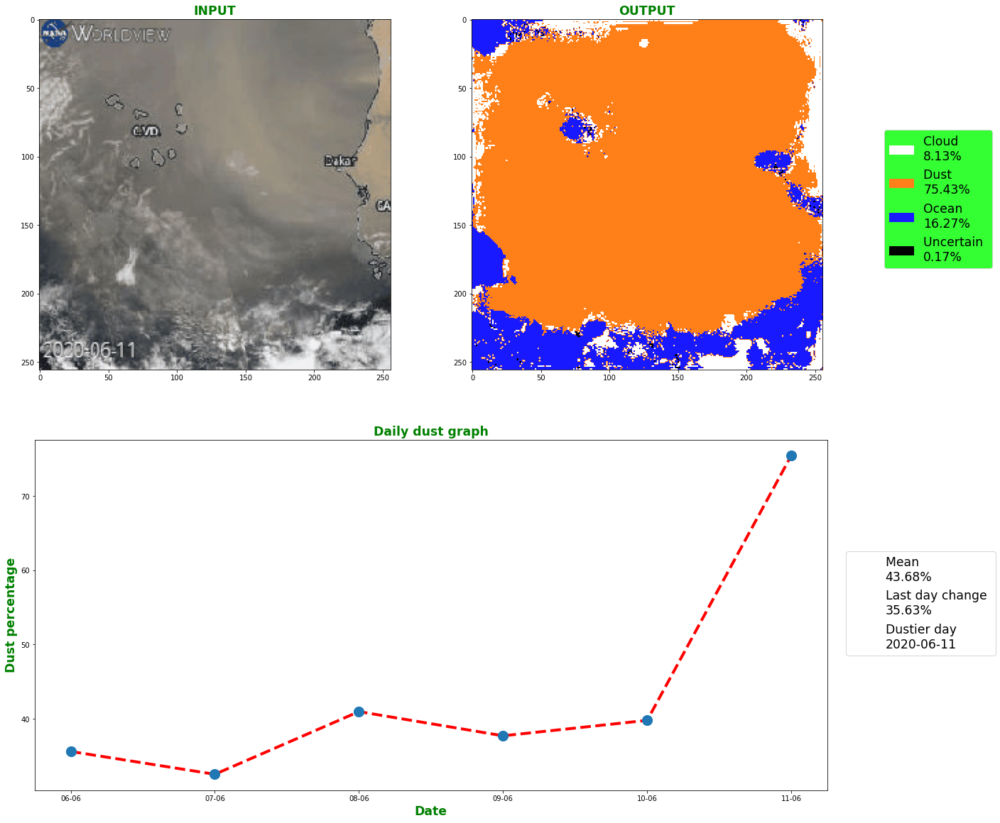

(256, 256, 4)
(256, 256, 4)
(256, 256)


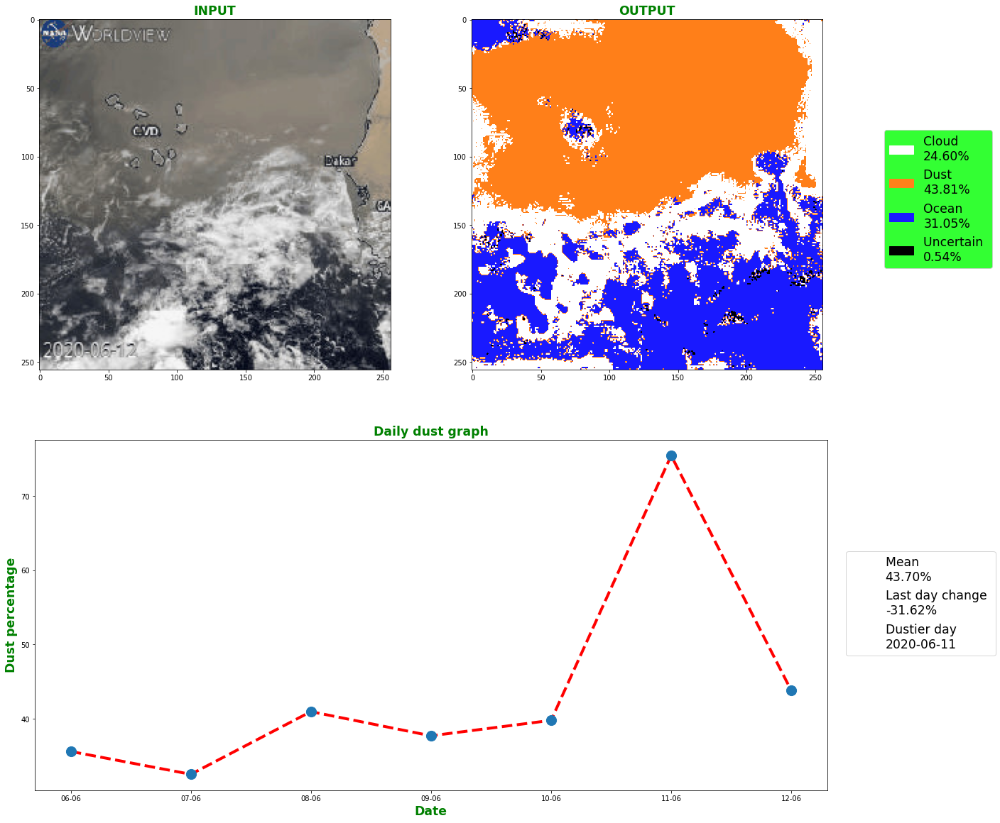

(256, 256, 4)
(256, 256, 4)
(256, 256)


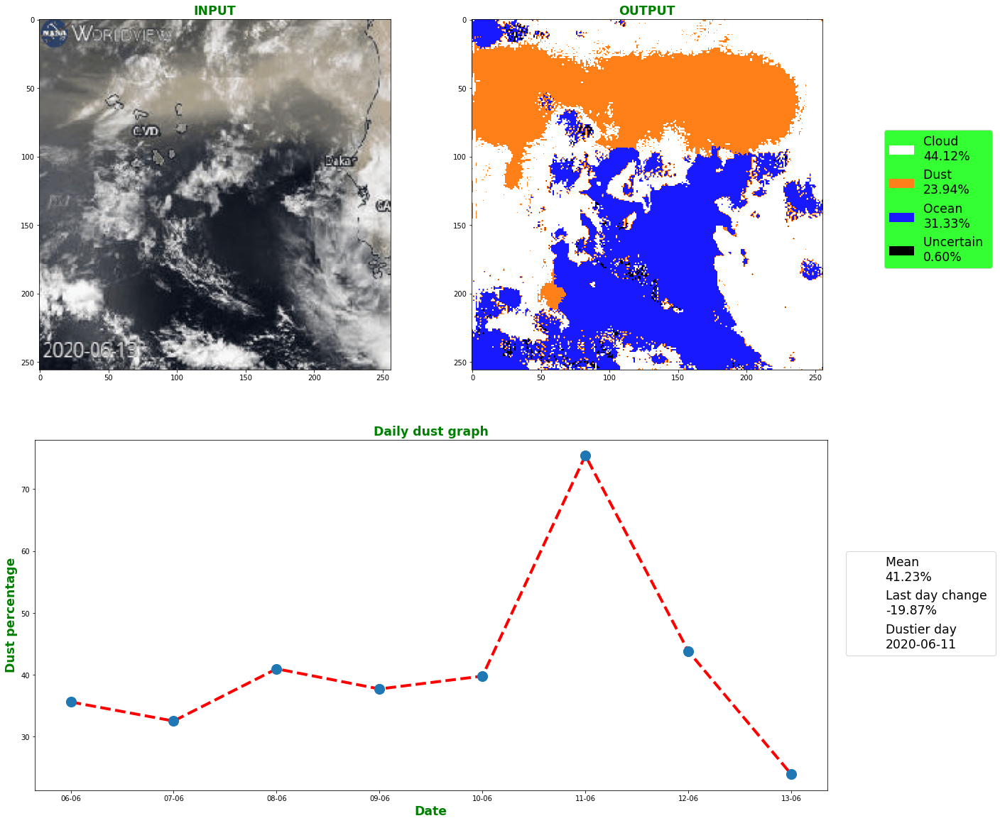

(256, 256, 4)
(256, 256, 4)
(256, 256)


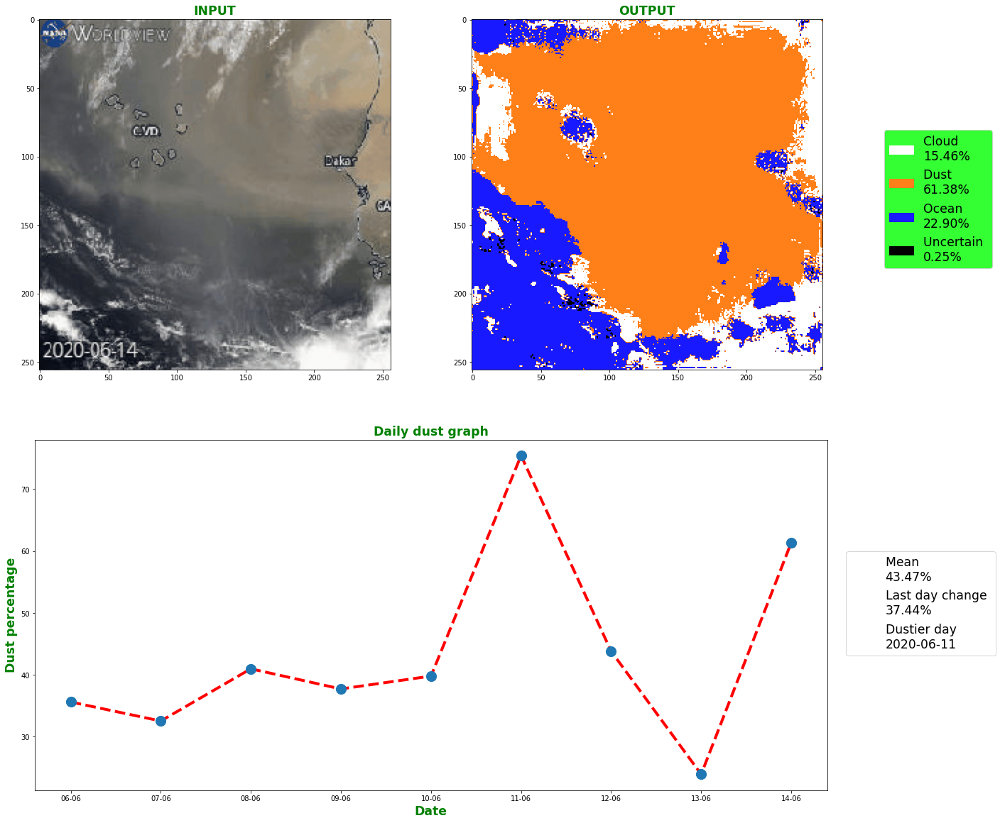

(256, 256, 4)
(256, 256, 4)
(256, 256)


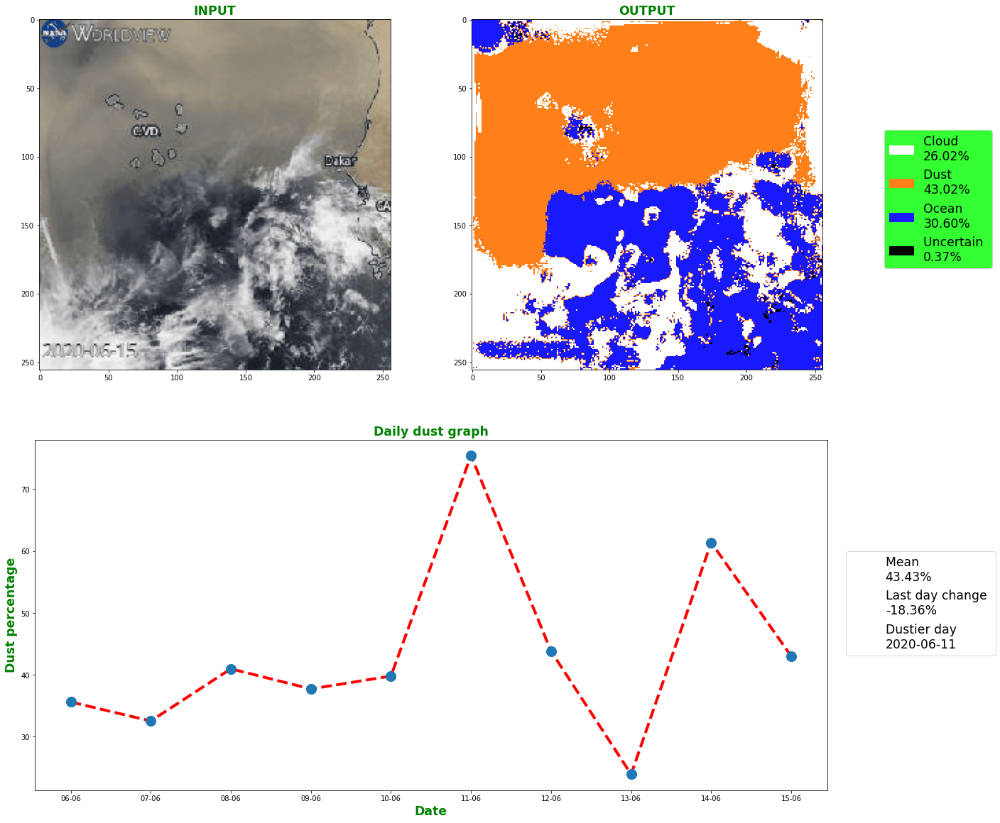

(256, 256, 4)
(256, 256, 4)
(256, 256)


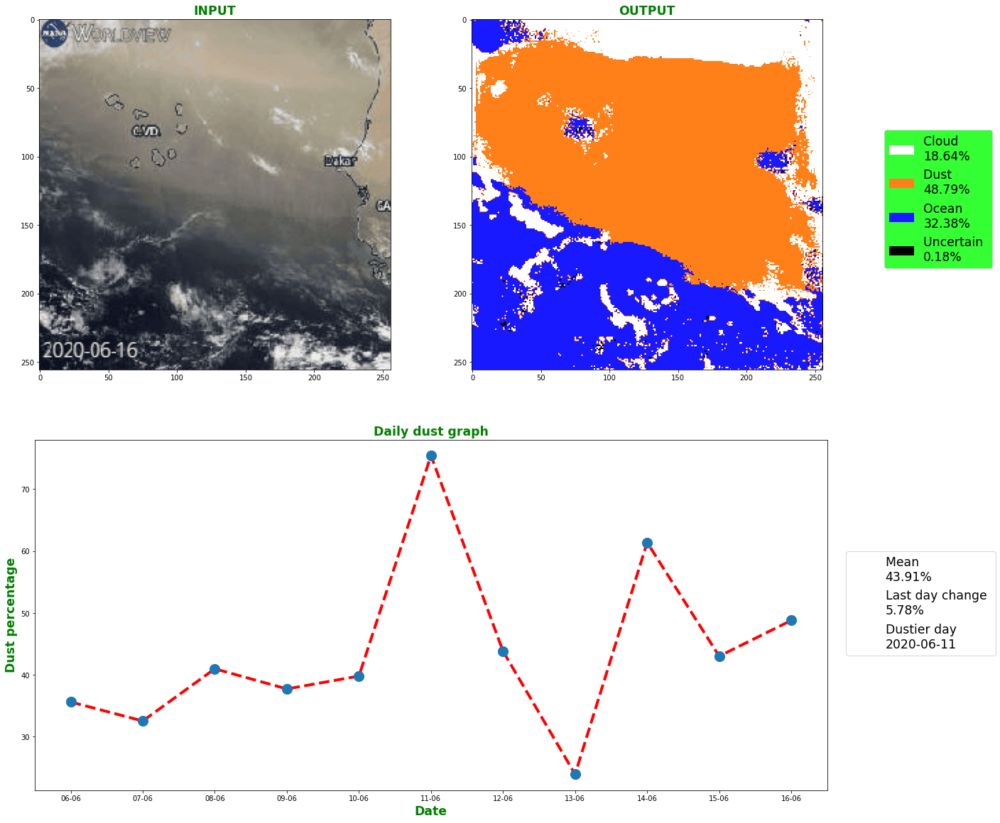

(256, 256, 4)
(256, 256, 4)
(256, 256)


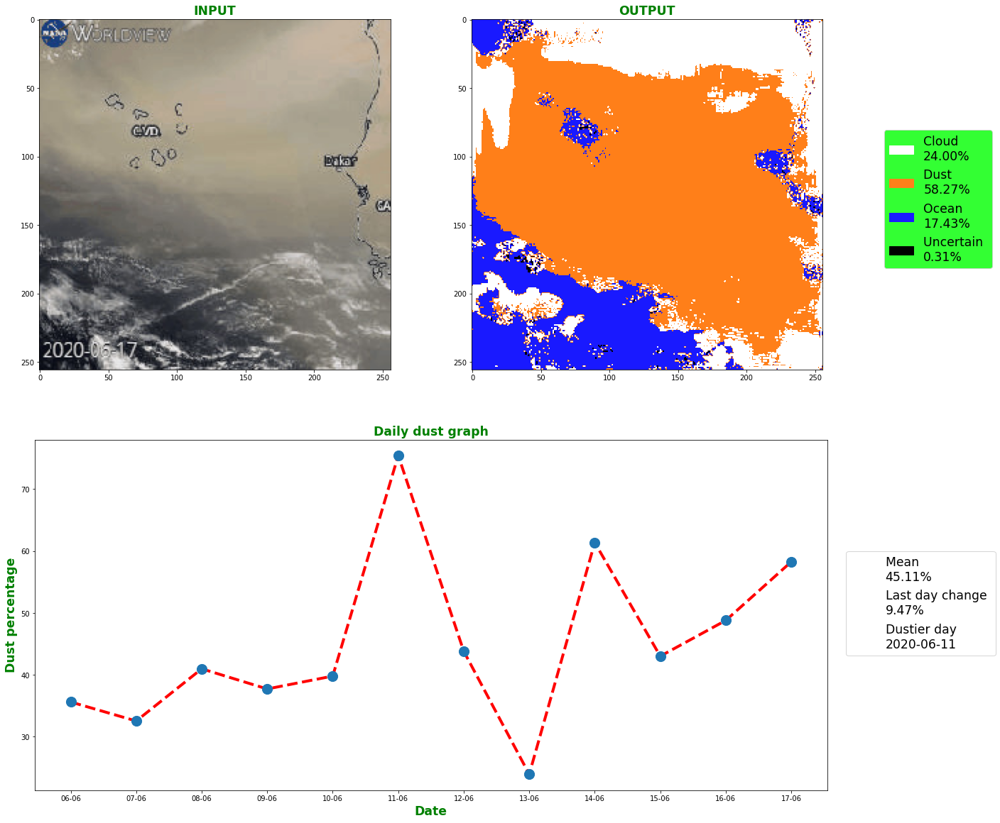

(256, 256, 4)
(256, 256, 4)
(256, 256)


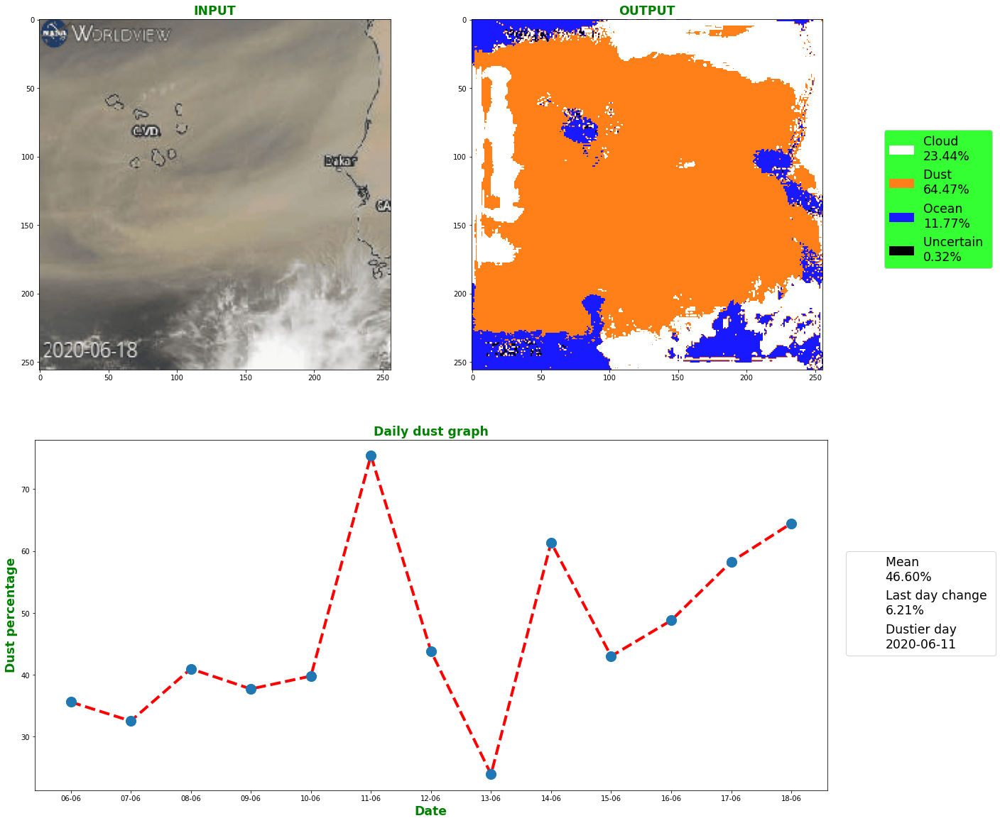

(256, 256, 4)
(256, 256, 4)
(256, 256)


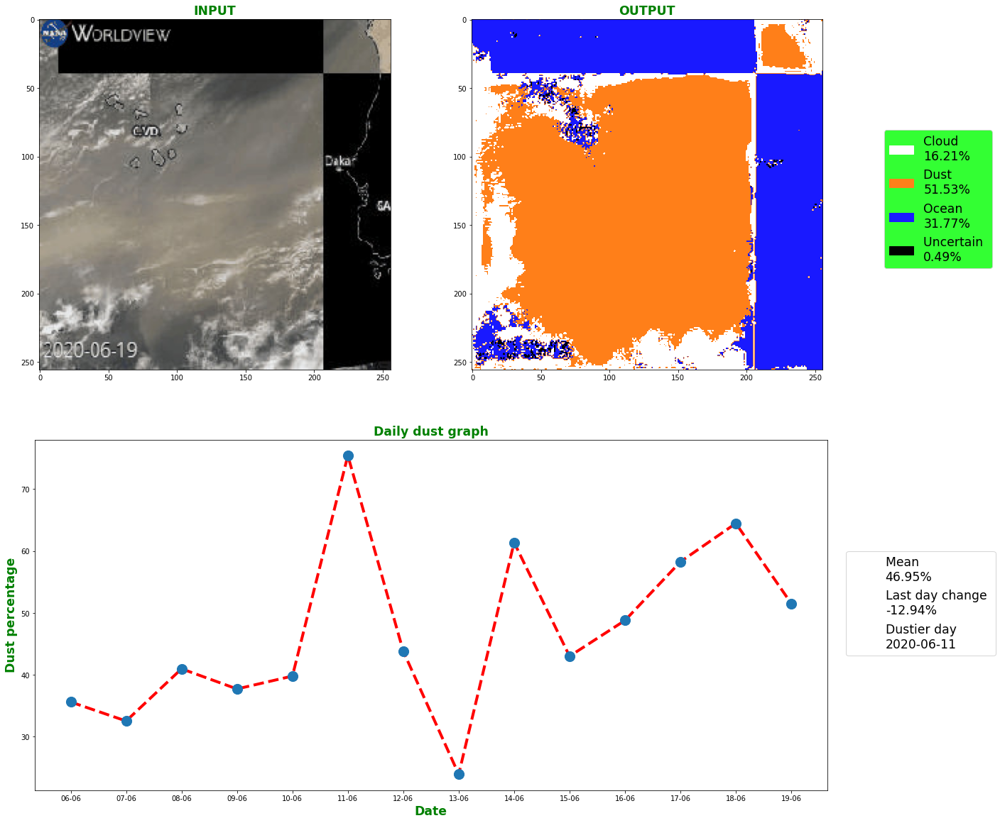

(256, 256, 4)
(256, 256, 4)
(256, 256)


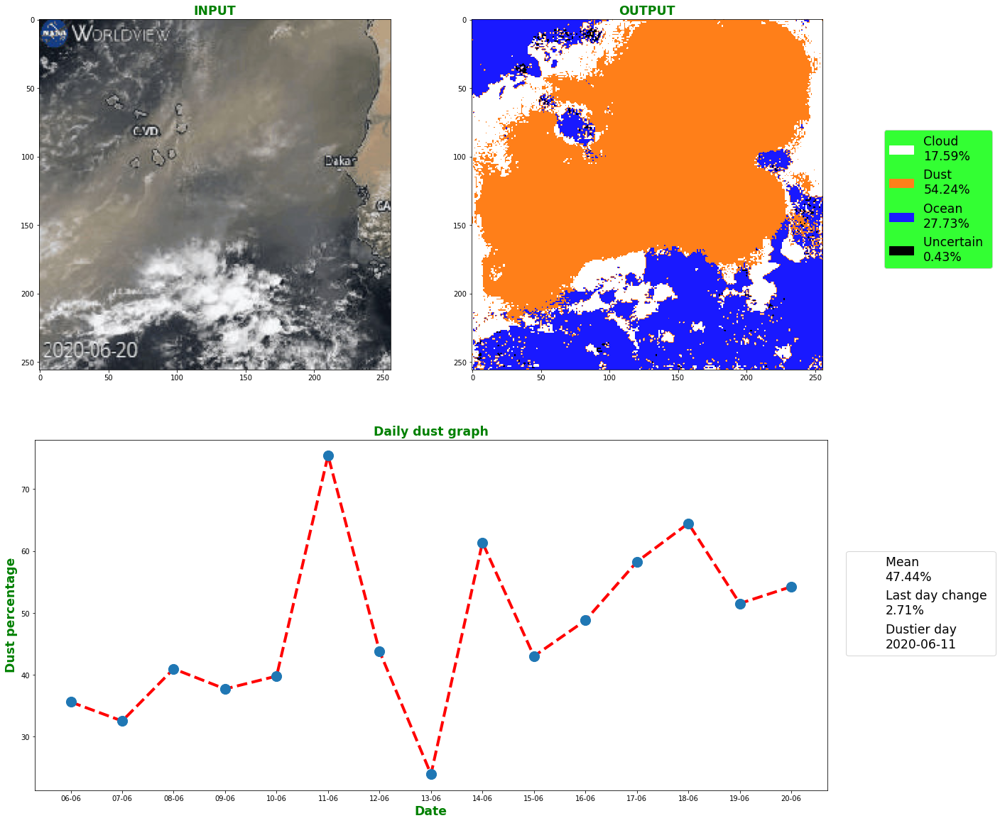

(256, 256, 4)
(256, 256, 4)
(256, 256)


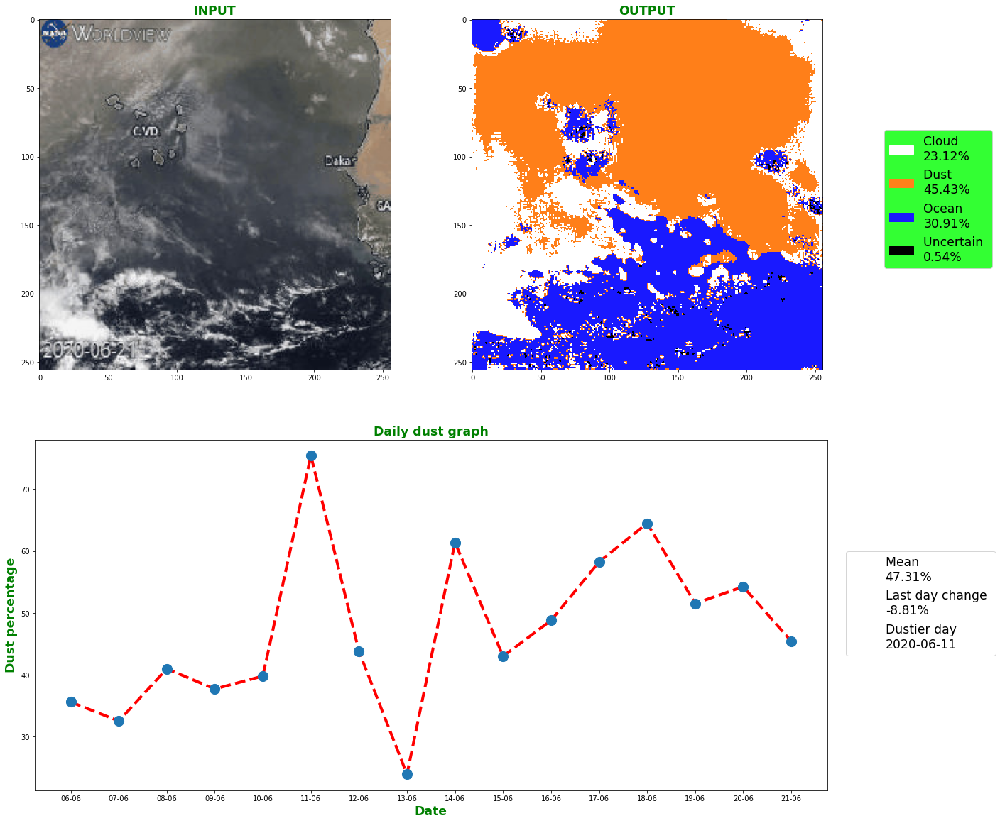

(256, 256, 4)
(256, 256, 4)
(256, 256)


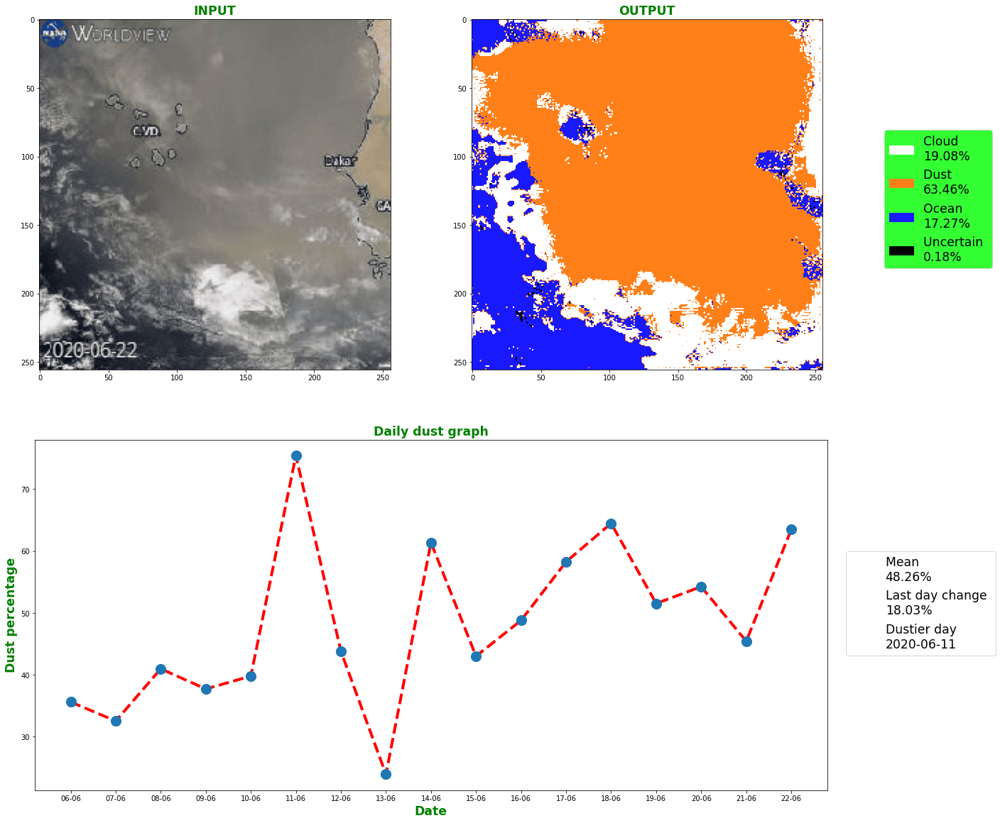

(256, 256, 4)
(256, 256, 4)
(256, 256)


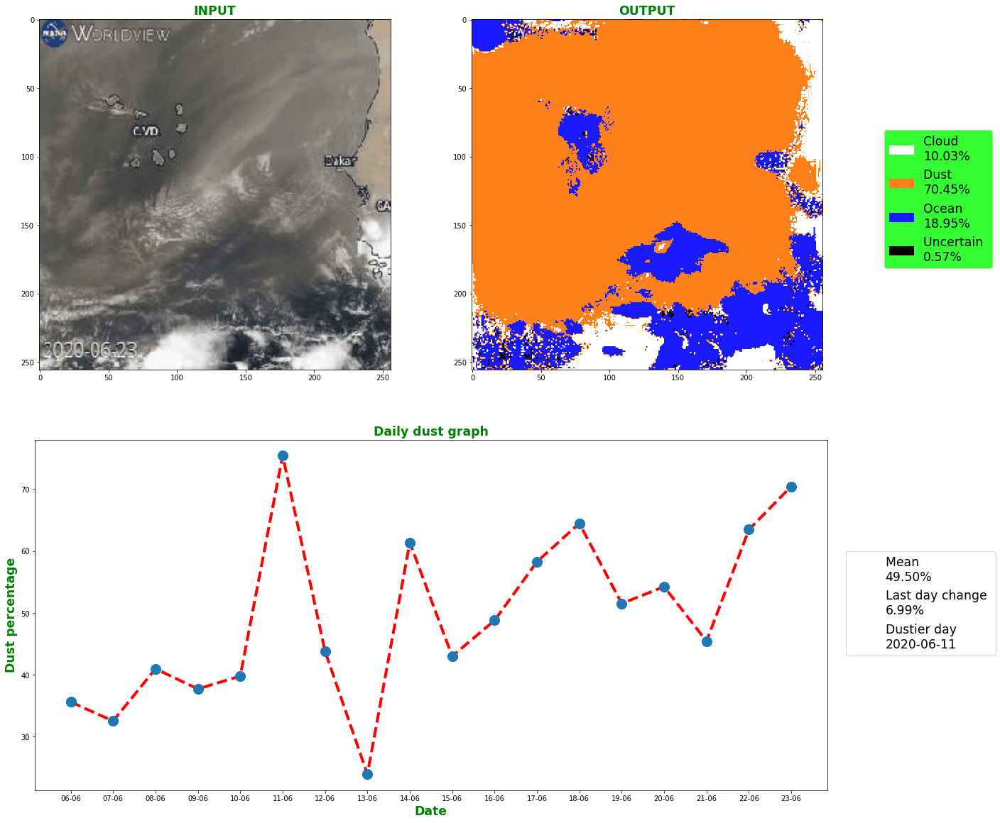

(256, 256, 4)
(256, 256, 4)
(256, 256)


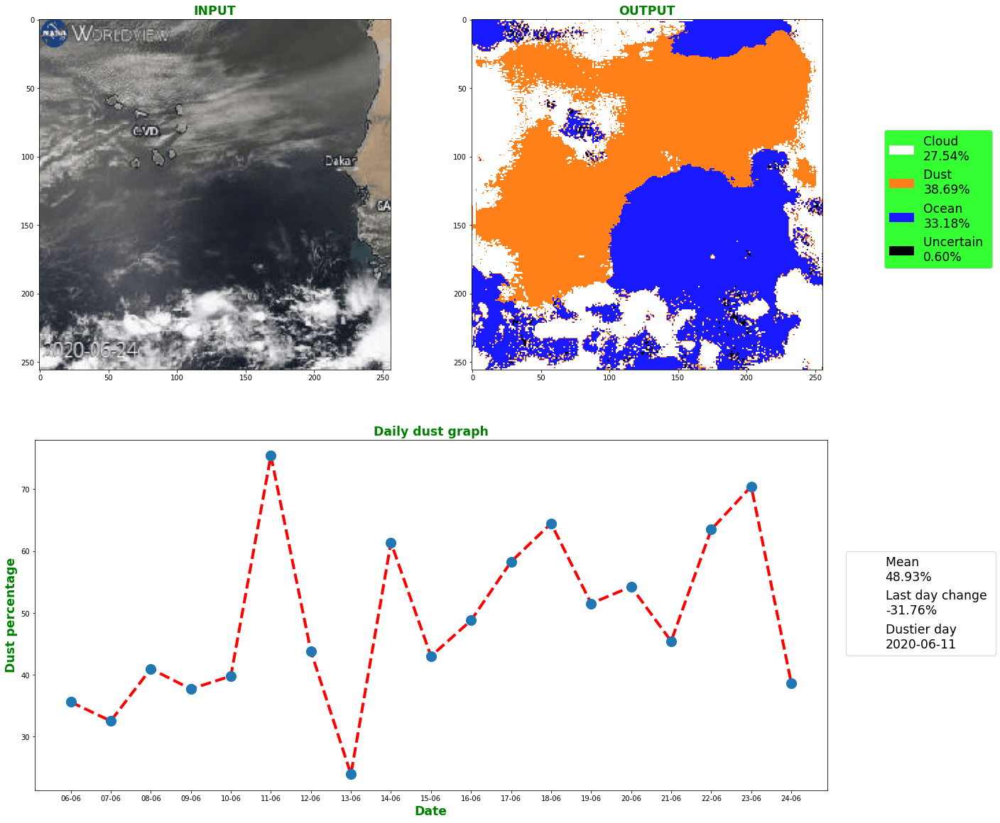

(256, 256, 4)
(256, 256, 4)
(256, 256)


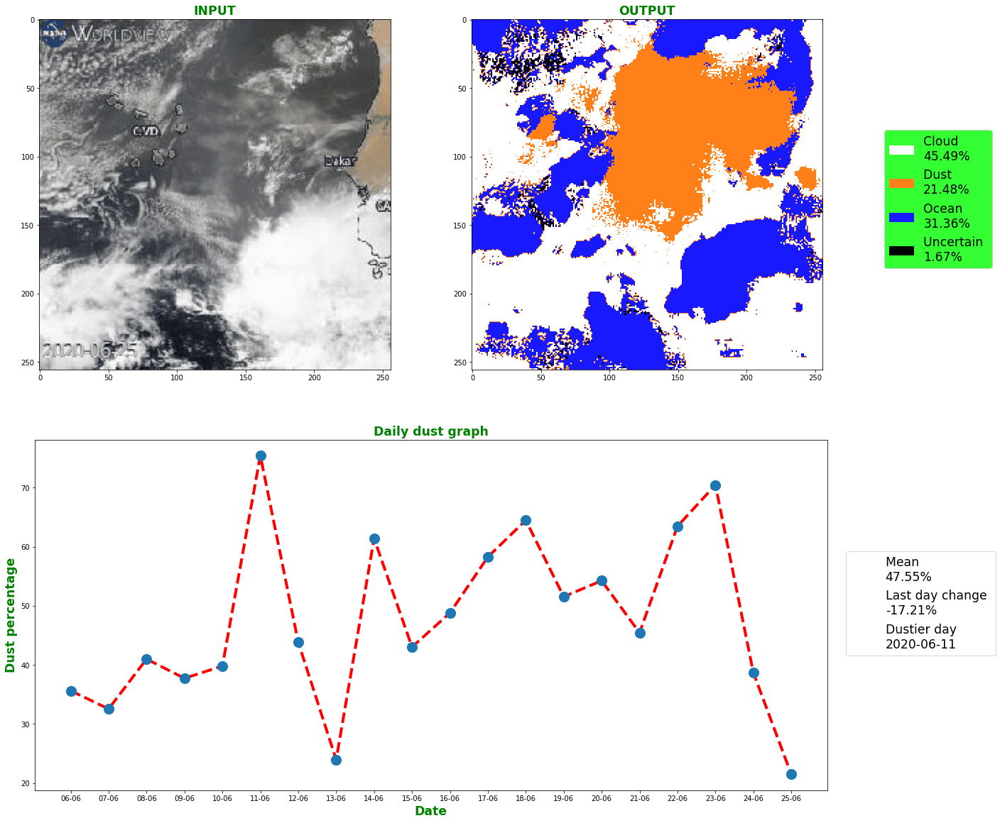

(256, 256, 4)
(256, 256, 4)
(256, 256)


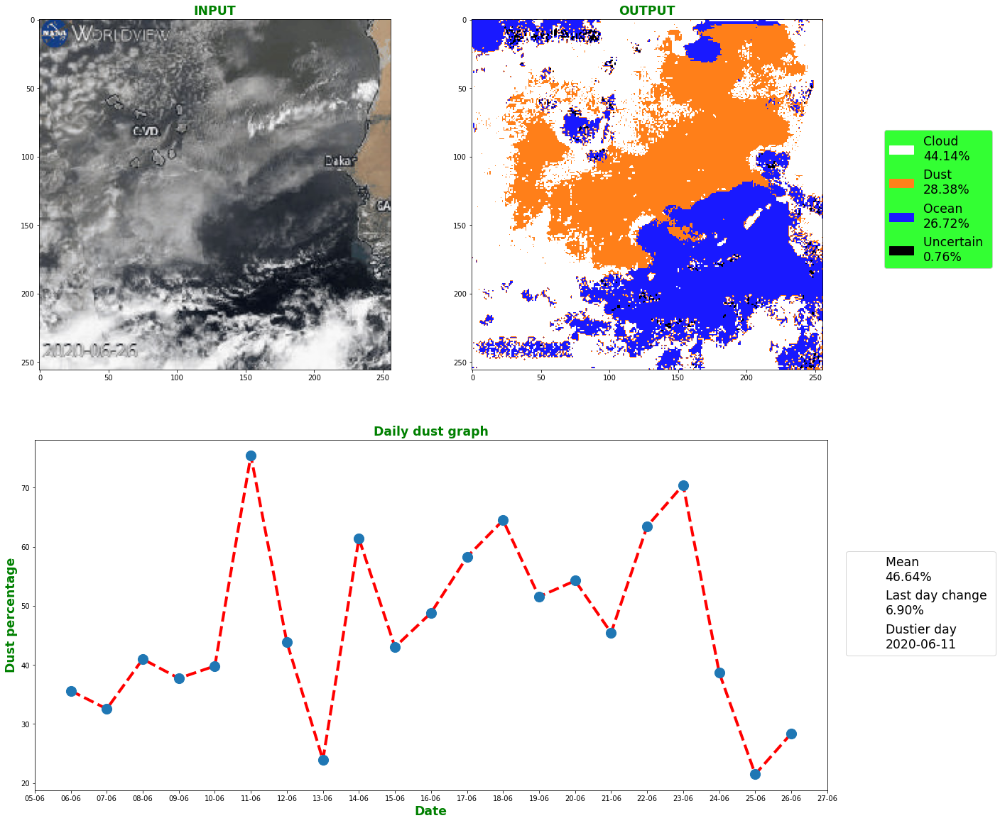

(256, 256, 4)
(256, 256, 4)
(256, 256)


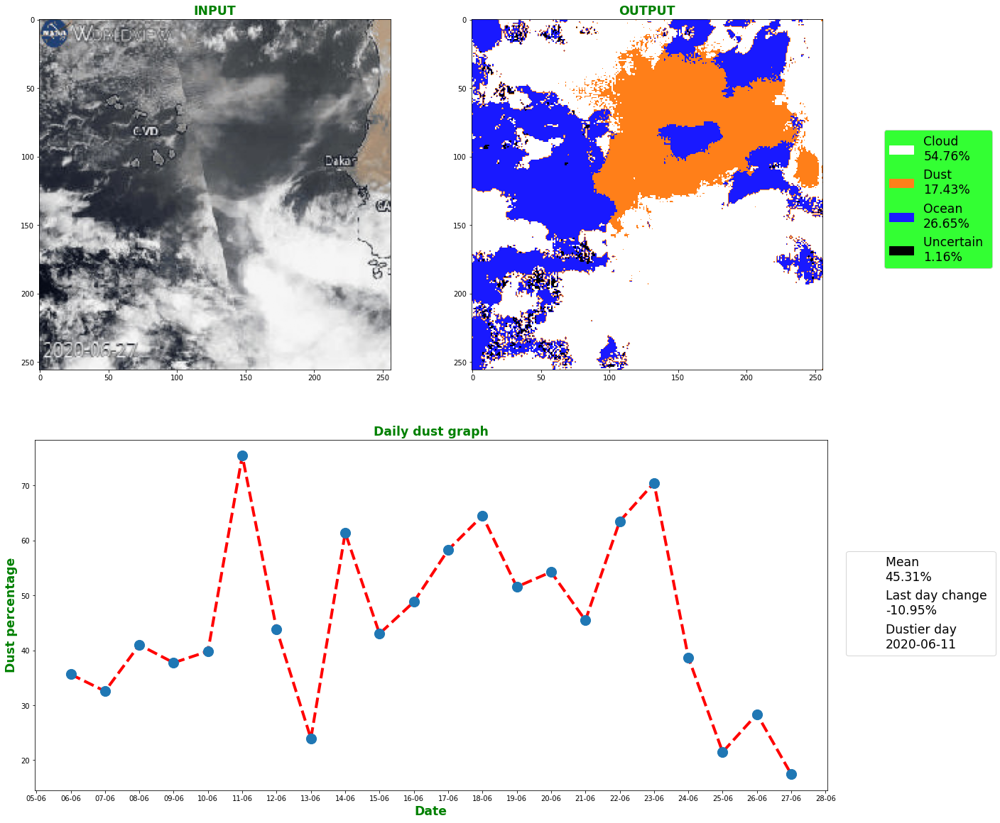

(256, 256, 4)
(256, 256, 4)
(256, 256)


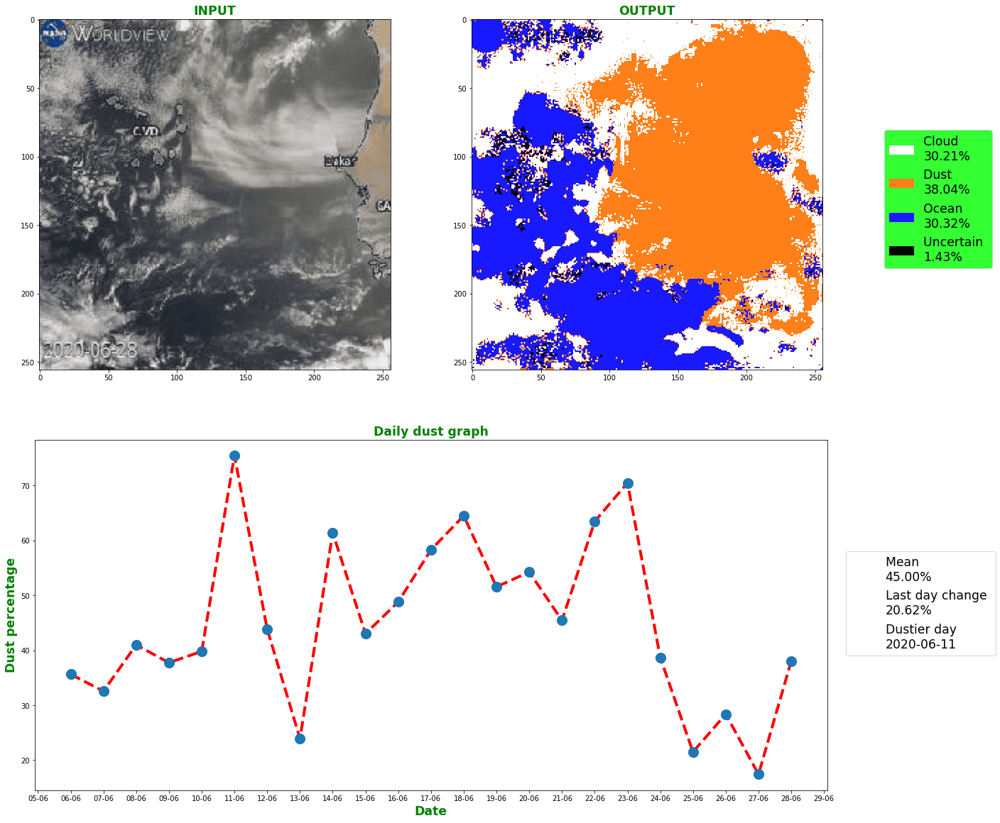

(256, 256, 4)
(256, 256, 4)
(256, 256)


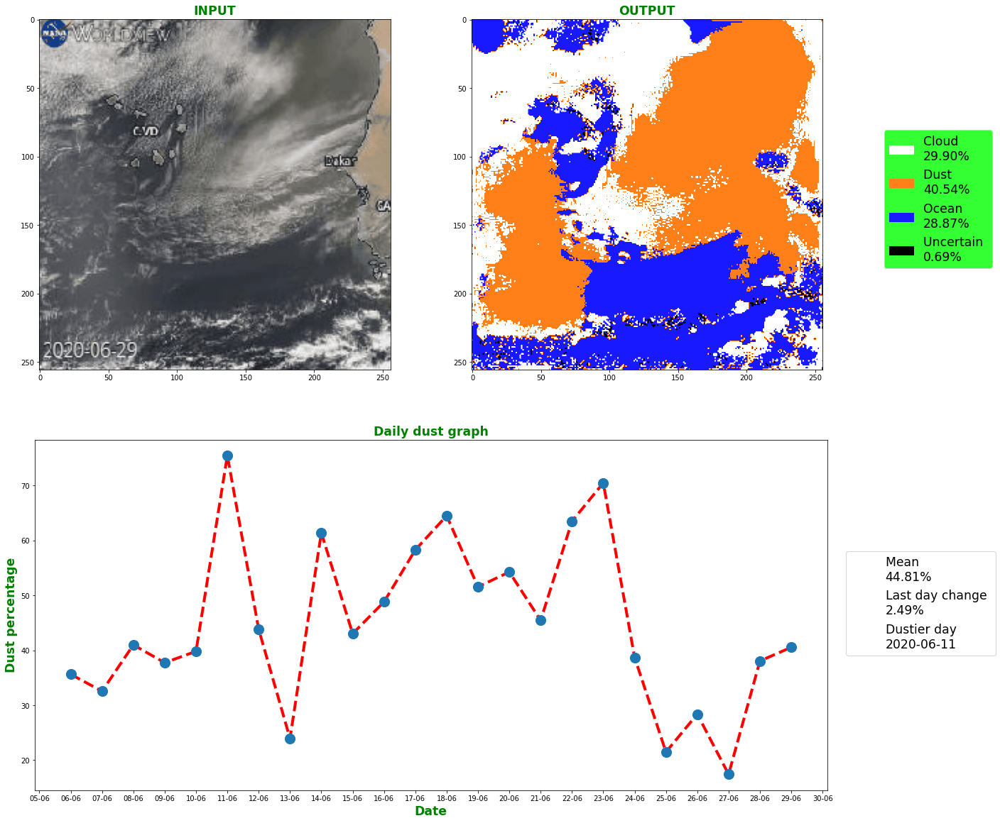

(256, 256, 4)
(256, 256, 4)
(256, 256)


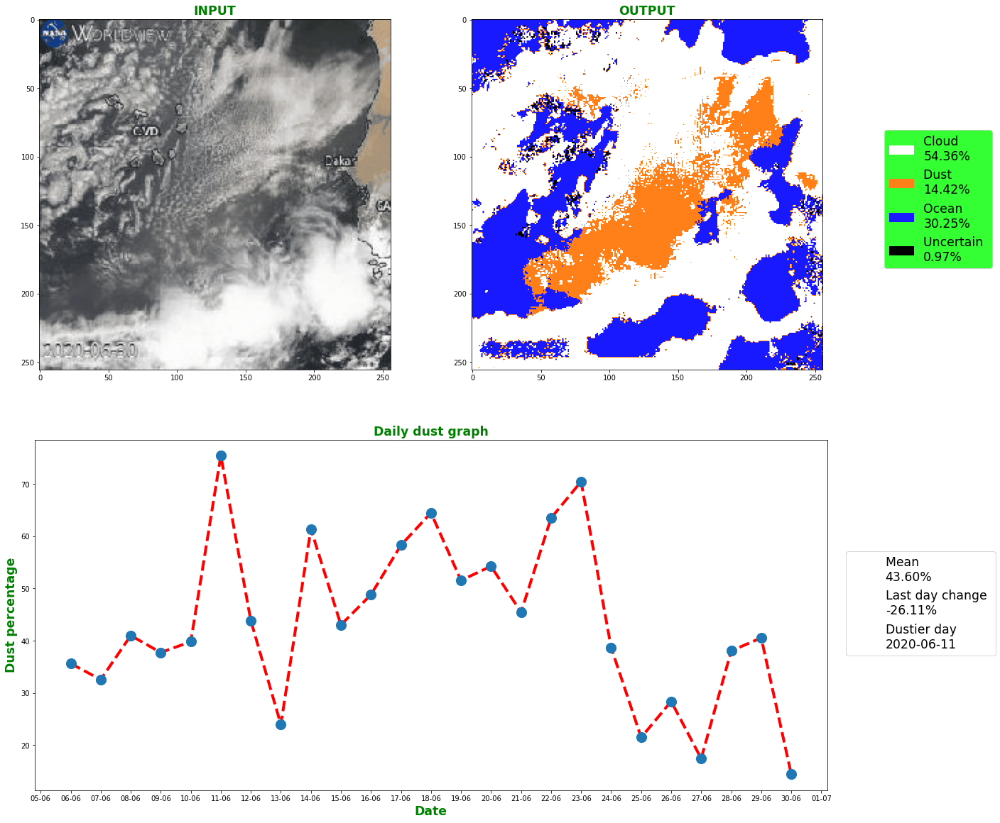

(256, 256, 4)
(256, 256, 4)
(256, 256)


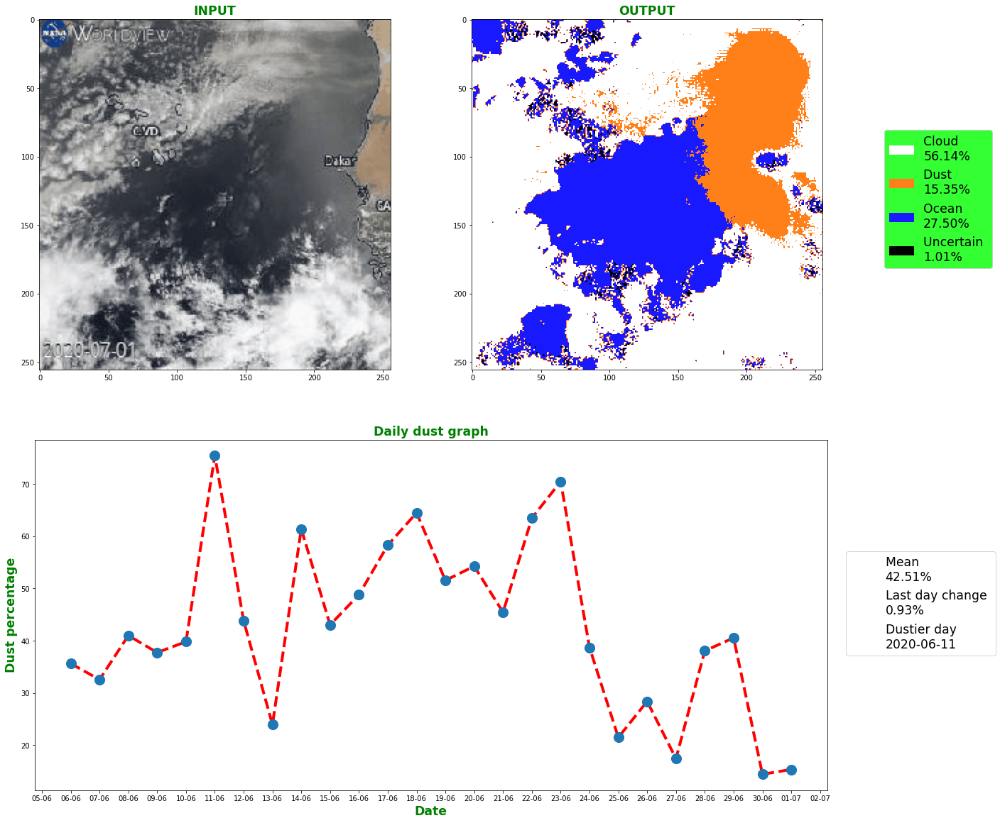

In [134]:
test_path = "/content/test_data"
image_list = os.listdir(test_path)
image_list = sorted(image_list)
predict_mask(models = [sequential_models, unet_models], 
             uncertain_threshold = 0.2,
             image_path = test_path,
             image_list = image_list)

In [135]:
imageio.plugins.freeimage.download()
predict_path = "/content/predicts"
predict_list = os.listdir(predict_path)
predict_list = sorted(predict_list)

images = []

for imagefile in predict_list:
    image = imageio.imread(os.path.join(predict_path,imagefile))
    images.append(image)

imageio.mimsave("/content/image.gif", images, 'GIF-FI', fps = 1)

In [136]:
files.download("/content/image.gif")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>